# Object counting

In [ ]:
%%sh
pip install torch==1.10.0+cu111 torchvision==0.11.0+cu111 torchaudio==0.10.0 -f https://download.pytorch.org/whl/torch_stable.html
pip install timm==0.4.12
pip install huggingface_hub==0.23.5 peft==0.11.0
pip install numpy
pip install matplotlib tqdm
pip install tensorboard
pip install scipy
pip install imgaug
pip install opencv-python
pip3 install hub
pip install lightning
pip install wandb
pip install gdown
pip install peft

git clone https://github.com/PhongHuynh0394/seminar.git
mv seminar/* .
rm -rf seminar

Looking in links: https://download.pytorch.org/whl/torch_stable.html
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.0/377.0 kB 12.3 MB/s eta 0:00:00
  Attempting uninstall: timm
    Found existing installation: timm 1.0.12
    Uninstalling timm-1.0.12:
      Successfully uninstalled timm-1.0.12
INFO: pip is looking at multiple versions of transformers to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 402.8/402.8 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.2/251.2 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 42.7 MB/s eta 0:00:00
  Attempting uninstall: huggingface_hub
    Found existing installation: hug

ERROR: Could not find a version that satisfies the requirement torch==1.10.0+cu111 (from versions: 1.11.0, 1.11.0+cpu, 1.11.0+cu102, 1.11.0+cu113, 1.11.0+cu115, 1.11.0+rocm4.3.1, 1.11.0+rocm4.5.2, 1.12.0, 1.12.0+cpu, 1.12.0+cu102, 1.12.0+cu113, 1.12.0+cu116, 1.12.0+rocm5.0, 1.12.0+rocm5.1.1, 1.12.1, 1.12.1+cpu, 1.12.1+cu102, 1.12.1+cu113, 1.12.1+cu116, 1.12.1+rocm5.0, 1.12.1+rocm5.1.1, 1.13.0, 1.13.0+cpu, 1.13.0+cu116, 1.13.0+cu117, 1.13.0+cu117.with.pypi.cudnn, 1.13.0+rocm5.1.1, 1.13.0+rocm5.2, 1.13.1, 1.13.1+cpu, 1.13.1+cu116, 1.13.1+cu117, 1.13.1+cu117.with.pypi.cudnn, 1.13.1+rocm5.1.1, 1.13.1+rocm5.2, 2.0.0, 2.0.0+cpu, 2.0.0+cpu.cxx11.abi, 2.0.0+cu117, 2.0.0+cu117.with.pypi.cudnn, 2.0.0+cu118, 2.0.0+rocm5.3, 2.0.0+rocm5.4.2, 2.0.1, 2.0.1+cpu, 2.0.1+cpu.cxx11.abi, 2.0.1+cu117, 2.0.1+cu117.with.pypi.cudnn, 2.0.1+cu118, 2.0.1+rocm5.3, 2.0.1+rocm5.4.2, 2.1.0, 2.1.0+cpu, 2.1.0+cpu.cxx11.abi, 2.1.0+cu118, 2.1.0+cu121, 2.1.0+cu121.with.pypi.cudnn, 2.1.0+rocm5.5, 2.1.0+rocm5.6, 2.1.1, 2.1.

In [ ]:
from google.colab import userdata

import os

import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from PIL import Image
import pandas as pd

from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint, LearningRateMonitor, EarlyStopping
from pytorch_lightning.loggers import WandbLogger
import wandb

import timm
import timm.optim.optim_factory as optim_factory

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from torchmetrics import MeanSquaredError, MeanAbsoluteError

from torchvision import transforms
import torchvision
import torchvision.transforms.functional as TF

import random
from scipy.ndimage import gaussian_filter
import imgaug.augmenters as iaa
from imgaug.augmentables import Keypoint, KeypointsOnImage


In [ ]:
def seed_everything(seed: int = 42):
    """
    Seed all relevant random number generators for reproducibility.
    """
    # Python random module
    random.seed(seed)

    # Numpy
    np.random.seed(seed)

    # PyTorch (CPU)
    torch.manual_seed(seed)

    # PyTorch (GPU)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)  # Seed all GPUs

    # Deterministic algorithms
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False  # Set to True if using a fixed input size and model

    # Set environment variables to disable non-deterministic behavior (e.g., in multi-threading)
    os.environ['PYTHONHASHSEED'] = str(seed)
seed_everything()

## Data Preparation

In this section, we will load our SKU110K-for-counting dataset that we prepared and see some overview of this dataset. Then we will write the `Dataset` and `DatasetLoader` to prepare for model training

In [ ]:
from google.colab import userdata
os.environ['KAGGLE_KEY'] = userdata.get("KAGGLE_KEY")
os.environ['KAGGLE_USERNAME'] = userdata.get("KAGGLE_USER")

In [ ]:
!kaggle datasets download -d hunhluvnhphong/sku110k-for-counting

Dataset URL: https://www.kaggle.com/datasets/hunhluvnhphong/sku110k-for-counting
License(s): MIT
 99% 841M/848M [00:12<00:00, 26.9MB/s]
100% 848M/848M [00:13<00:00, 68.4MB/s]


In [ ]:
import zipfile

path = "sku110k-for-counting.zip"

with zipfile.ZipFile(path, 'r') as zip_ref:
  zip_ref.extractall()

Login to wandb logger

In [ ]:
# from kaggle_secrets import UserSecretsClient
# os.environ['WANDB_API_KEY'] = UserSecretsClient().get_secret("WANDB_API_KEY")
os.environ['WANDB_API_KEY'] = userdata.get("WANDB_API_KEY")

In [ ]:
!wandb login

wandb: Currently logged in as: meooggi133 (meooggi133-tr-ng-i-h-c-khoa-h-c-t-nhi-n-hqg-hcm). Use `wandb login --relogin` to force relogin


### Dataset overview

**Note**: This notebook executed on Kaggle environment. Therefore, the dataset is already loaded in workspace. The dataset [SKU110K for counting](https://www.kaggle.com/datasets/hunhluvnhphong/sku110k-for-counting)

In [ ]:
path = "/kaggle/input/sku110k-for-counting/sku-counting/SKU_Processes"
split = ['train', 'val', 'test']

for s in split:
  len_image = len(os.listdir(os.path.join(path, s + "/images")))
  len_label = len(os.listdir(os.path.join(path, s + "/density_gt")))
  print(f"Len of {s} images: {len_image}")
  print(f"Len of {s} labels: {len_label}")
  print("-"*10)

Len of train images: 3000
Len of train labels: 3000
----------
Len of val images: 584
Len of val labels: 584
----------
Len of test images: 2920
Len of test labels: 2920
----------


In [ ]:
annotation_path = "/kaggle/input/sku110k-for-counting/sku-counting/annotation.json"

with open(annotation_path, "r") as f:
  data = json.load(f)

traindf = pd.DataFrame(data['train'])
valdf = pd.DataFrame(data['val'])
testdf = pd.DataFrame(data['test'])

<Axes: >

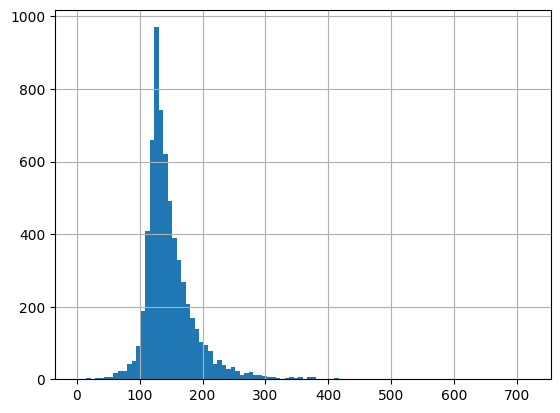

In [ ]:
df = pd.concat([traindf, valdf, testdf])
df['count'].hist(bins=100)

In [ ]:
data['train'][0].keys()

dict_keys(['lines_box', 'dots', 'count', 'image_file'])

In [ ]:
def draw(image, line_boxes=None, dots=None, density_map=None):
    """
    Generate and display three visualizations:
    1. Image with bounding boxes and dots.
    2. Standalone density map.
    3. Overlay of density map and image.

    Args:
    - image (PIL Image or NumPy array): The image to display.
    - line_boxes (list of tuples): Bounding boxes to draw on the image [[y1, x1, y2, x2], ...].
    - dots (list of tuples): Dot coordinates to overlay [(x, y), ...].
    - density_map (numpy array, optional): The density map to overlay on the image.
    """

    # Convert PIL image to NumPy array if necessary
    if not isinstance(image, np.ndarray):
        image_np = np.array(image)
        if image_np.shape[0] == 3:
          image_np = image_np.transpose(1, 2, 0)
    else:
        image_np = image


    # Ensure the density map matches the image size
    density_map_resized = None
    if density_map is not None:
        density_map_resized = np.array(density_map)

    # Create a figure with 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(20, 10))

    # --- 1. Image with bounding boxes and dots ---
    ax1 = axes[0]
    ax1.imshow(image_np)
    ax1.set_title("Image with Bounding Boxes and Dots")
    ax1.axis("off")

    # Draw bounding boxes
    if line_boxes:
      for box in line_boxes:
          y1, x1, y2, x2 = box
          ax1.plot(
              [x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1],
              color="green", linewidth=2, label="Bounding Box"
          )

    # Draw dots
    if dots:
      dots_np = np.array(dots)
      ax1.scatter(
          dots_np[:, 0], dots_np[:, 1],
          c="red", s=30, label="Object Centers"
      )  # Red dots


    # --- 2. Standalone density map ---
    ax2 = axes[1]
    if density_map_resized is not None:
        im2 = ax2.imshow(
            density_map_resized,
            cmap="viridis",
            vmin=0,  # Set minimum value for the colormap
            vmax=density_map_resized.max(),  # Set maximum value for the colormap
            interpolation="nearest"
        )
        ax2.set_title("Standalone Density Map")
        fig.colorbar(im2, ax=ax2, shrink=0.8)
    ax2.axis("off")



    # --- 3. Overlay of density map and image ---
    ax3 = axes[2]
    ax3.imshow(image_np, alpha=1.0)
    if density_map_resized is not None:
        ax3.imshow(
            density_map_resized,
            cmap="viridis",
            alpha=0.5,  # Adjust transparency
            vmin=0,  # Set minimum value for the colormap
            vmax=density_map_resized.max(),  # Set maximum value for the colormap
            # interpolation="nearest"
        )

    ax3.set_title("Overlay of Density Map and Image")
    ax3.axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
def get_info(sample, split="train"):
  result = dict()
  base_name = f"/kaggle/input/sku110k-for-counting/sku-counting/SKU_Processes/{split}"
  result['image_path'] = os.path.abspath(os.path.join(base_name + "/images", sample["image_file"]))
  result['density_path'] = os.path.abspath(os.path.join(base_name + "/density_gt", sample["image_file"].replace(".jpg", ".npy")))
  result['count'] = sample["count"]
  result["lines_box"] = sample["lines_box"]
  result['dots'] = sample["dots"]
  return result

Count ground truth:  131
Count density:  130.99983
Size of the image (384, 512)
Size of the density map (512, 384)


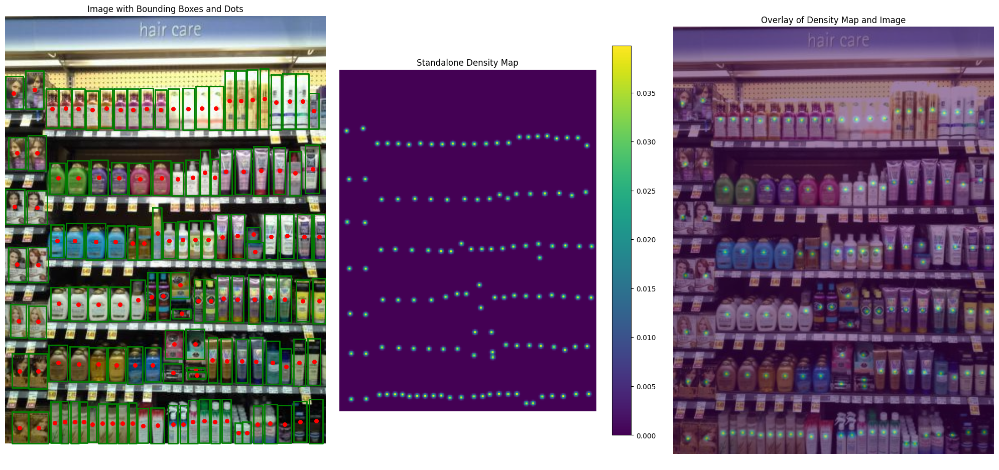

In [ ]:
idx = 1000
split = "test"

sample = get_info(data[split][idx], split=split)
image = Image.open(sample['image_path'])
density = np.load(sample['density_path'])

print("Count ground truth: ", sample['count'])
print(f"Count density: ", density.sum())
print(f"Size of the image {image.size}")
print(f"Size of the density map {density.shape}")
draw(image, sample['lines_box'], sample['dots'], density)

In [ ]:
len(data['train'])

2999

In [ ]:
sample

{'image_path': '/kaggle/input/sku110k-for-counting/sku-counting/SKU_Processes/train/images/train_3029.jpg',
 'density_path': '/kaggle/input/sku110k-for-counting/sku-counting/SKU_Processes/train/density_gt/train_3029.npy',
 'count': 1,
 'lines_box': [[520, 332, 578, 360]],
 'dots': [[346, 549]]}

### Dataset Preprocessing

Task to be implemented:
1. Create a dataset class for train, val and test
2. Implement transforming and data augmentation with dataset

In [ ]:
IM_NORM_MEAN = [0.485, 0.456, 0.406]
IM_NORM_STD = [0.229, 0.224, 0.225]
MAX_HW = 384

TTensor = transforms.Compose([
    transforms.ToTensor(),
])

Augmentation = transforms.Compose([
    transforms.ColorJitter(brightness=0.25, contrast=0.15, saturation=0.15, hue=0.15),
    transforms.GaussianBlur(kernel_size=(7, 9))
])

Normalize = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=IM_NORM_MEAN, std=IM_NORM_STD)
])

In [ ]:
class TransformTrain:
    """
    Resize the image so that:
        1. Image is equal to 384 * 384
        2. The new height and new width are divisible by 16
        3. The aspect ratio is possibly preserved

    Density map is cropped to have the same size(and position) with the cropped image
    Exemplar boxes may be outside the cropped area.
    Augmentation including Gaussian noise, Color jitter, Gaussian blur, Random affine, Random horizontal flip and Mosaic (or Random Crop if no Mosaic) is used.

    """

    def __init__(self, MAX_HW=384, do_aug=True, im_dir=None, annotations=None):
        self.max_hw = MAX_HW
        self.do_aug = do_aug
        self.im_dir = im_dir
        self.annotations = annotations

    def flex_resize(self, h, w):
        """
        Flexible resize. Brings the smallest size to MAX_HW and scales the other size accordingly.
        """
        if h < self.max_hw <= w or h <= w < self.max_hw:
            new_h = self.max_hw
            new_w = round(w * new_h / h)
        elif w < self.max_hw <= h or w < h < self.max_hw:
            new_w = self.max_hw
            new_h = round(h * new_w / w)
        else:
            new_w = 16 * int(w / 16)
            new_h = 16 * int(h / 16)
        return new_h, new_w

    # Check im_id, m_flag
    def __call__(self, sample):
        image, lines_boxes, dots, im_id, m_flag = sample['image'], sample['lines_box'], sample['dots'], sample['image_name'], sample['m_flag']
        im_id += ".jpg"

        W, H = image.size
        new_H, new_W = self.flex_resize(H, W)
        scale_factor_h = float(new_H) / H
        scale_factor_w = float(new_W) / W
        resized_image = transforms.Resize((new_H, new_W))(image)
        resized_image = TTensor(resized_image)
        resized_density = np.zeros((new_H, new_W), dtype='float32')

        # Augmentation probability
        aug_flag = self.do_aug
        mosaic_flag = random.random() < 0.25

        if aug_flag:
            # Gaussian noise
            noise = np.random.normal(0, 0.1, resized_image.size())
            noise = torch.from_numpy(noise)
            re_image = resized_image + noise
            re_image = torch.clamp(re_image, 0, 1)

            # Color jitter and Gaussian blur
            Augmentation = transforms.Compose([
              transforms.ColorJitter(brightness=0.25, contrast=0.15, saturation=0.15, hue=0.15),
              transforms.GaussianBlur(kernel_size=(7, 9))
            ])
            re_image = Augmentation(re_image)

            # Random affine
            re1_image = re_image.transpose(0, 1).transpose(1, 2).numpy()
            keypoints = []
            for i in range(dots.shape[0]):
                keypoints.append(Keypoint(x=min(new_W - 1, int(dots[i][0] * scale_factor_w)), y=min(new_H - 1, int(dots[i][1] * scale_factor_h))))
            kps = KeypointsOnImage(keypoints, re1_image.shape)
            seq = iaa.Sequential([
                iaa.Affine(
                    rotate=(-15, 15),
                    scale=(0.8, 1.2),
                    shear=(-10, 10),
                    translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}
                )
            ])
            re1_image, kps_aug = seq(image=re1_image, keypoints=kps)

            # Produce dot annotation map
            resized_density = np.zeros((resized_density.shape[0], resized_density.shape[1]), dtype='float32')

            for i in range(len(kps.keypoints)):
                if (int(kps_aug.keypoints[i].y) <= new_H - 1 and int(kps_aug.keypoints[i].x) <= new_W - 1) and not \
                    kps_aug.keypoints[i].is_out_of_image(re1_image):
                    resized_density[int(kps_aug.keypoints[i].y)][int(kps_aug.keypoints[i].x)] = 1

            resized_density = torch.from_numpy(resized_density)
            re_image = TTensor(re1_image)

            # Random horizontal flip
            flip_p = random.random()

            if flip_p > 0.5:
                re_image = TF.hflip(re_image)
                resized_density = TF.hflip(resized_density)

            # Random self mosaic
            if mosaic_flag:
                image_array = []
                map_array = []
                blending_l = random.randint(10, 20)
                resize_l = 192 + 2 * blending_l
                if dots.shape[0] >= 70:
                    for i in range(4):
                        length = random.randint(150, 384)
                        start_W = random.randint(0, new_W - length)
                        start_H = random.randint(0, new_H - length)
                        reresized_image1 = TF.crop(resized_image, start_H, start_W, length, length)
                        reresized_image1 = transforms.Resize((resize_l, resize_l))(reresized_image1)
                        reresized_density1 = np.zeros((resize_l, resize_l), dtype='float32')

                        for i in range(dots.shape[0]):
                            if start_H <= min(new_H - 1, int(dots[i][1] * scale_factor_h)) < start_H + length and start_W <= min(new_W - 1, int(dots[i][0] * scale_factor_w)) < start_W + length:
                                reresized_density1[min(resize_l-1,int((min(new_H-1,int(dots[i][1] * scale_factor_h))-start_H)*resize_l/length))][min(resize_l-1,int((min(new_W-1,int(dots[i][0] * scale_factor_w))-start_W)*resize_l/length))]=1

                        reresized_density1 = torch.from_numpy(reresized_density1)
                        image_array.append(reresized_image1)
                        map_array.append(reresized_density1)
                else:
                    m_flag = 1
                    prob = random.random()

                    if prob > 0.25:
                        gt_pos = random.randint(0, 3)
                    else:
                        gt_pos = random.randint(0, 4)  # 5% 0 objects

                    for i in range(4):
                        if i == gt_pos:
                            Tim_id = im_id
                            r_image = resized_image
                            Tdots = dots
                            new_TH = new_H
                            new_TW = new_W
                            Tscale_factor_w = scale_factor_w
                            Tscale_factor_h = scale_factor_h
                        else:
                            Tim_id = random.randint(0, len(self.annotations) - 1)
                            Tdots = np.array(self.annotations[Tim_id]['dots'])
                            Timage = Image.open('{}/{}'.format(os.path.abspath(self.im_dir), self.annotations[Tim_id]['image_file']))
                            Timage.load()
                            new_TH, new_TW = self.flex_resize(Timage.size[1], Timage.size[0])
                            Tscale_factor_w = float(new_TW) / Timage.size[0]
                            Tscale_factor_h = float(new_TH) / Timage.size[1]
                            r_image = TTensor(transforms.Resize((new_TH, new_TW))(Timage))

                        length = random.randint(250, 384)
                        start_W = random.randint(0, new_TW - length)
                        start_H = random.randint(0, new_TH - length)
                        r_image1 = TF.crop(r_image, start_H, start_W, length, length)
                        r_image1 = transforms.Resize((resize_l, resize_l))(r_image1)
                        r_density1 = np.zeros((resize_l, resize_l), dtype='float32')

                        # Because all the class in the dataset are the same, the condition class_dict always be true
                        # if self.class_dict[im_id] == self.class_dict[Tim_id]:

                        for i in range(Tdots.shape[0]):
                            if start_H <= min(new_TH - 1, int(Tdots[i][1] * Tscale_factor_h)) < start_H + length and start_W <= min(new_TW - 1, int(Tdots[i][0] * Tscale_factor_w)) < start_W + length:
                                r_density1[min(resize_l-1,int((min(new_TH-1, int(Tdots[i][1] * Tscale_factor_h))-start_H)*resize_l/length))][min(resize_l-1,int((min(new_TW-1,int(Tdots[i][0] * Tscale_factor_w))-start_W)*resize_l/length))]=1

                        r_density1 = torch.from_numpy(r_density1)
                        image_array.append(r_image1)
                        map_array.append(r_density1)

                reresized_image5 = torch.cat((image_array[0][:, blending_l:resize_l-blending_l], image_array[1][:, blending_l: resize_l-blending_l]), 1)
                reresized_density5 = torch.cat((map_array[0][blending_l:resize_l-blending_l], map_array[1][blending_l: resize_l-blending_l]), 0)

                for i in range(blending_l):
                        reresized_image5[:, 192+i] = image_array[0][:, resize_l-1-blending_l+i] * (blending_l-i)/(2 * blending_l) + reresized_image5[:, 192+i] * (i+blending_l)/(2*blending_l)
                        reresized_image5[:, 191-i] = image_array[1][:, blending_l-i] * (blending_l-i)/(2*blending_l) + reresized_image5[:, 191-i] * (i+blending_l)/(2*blending_l)

                reresized_image5 = torch.clamp(reresized_image5, 0, 1)
                reresized_image6 = torch.cat((image_array[2][:, blending_l:resize_l-blending_l], image_array[3][:, blending_l: resize_l-blending_l]), 1)
                reresized_density6 = torch.cat((map_array[2][blending_l:resize_l-blending_l], map_array[3][blending_l:resize_l-blending_l]), 0)

                for i in range(blending_l):
                        reresized_image6[:, 192+i] = image_array[2][:, resize_l-1-blending_l+i] * (blending_l-i)/(2*blending_l) + reresized_image6[:, 192+i] * (i+blending_l)/(2*blending_l)
                        reresized_image6[:, 191-i] = image_array[3][:, blending_l-i] * (blending_l-i)/(2*blending_l) + reresized_image6[:, 191-i] * (i+blending_l)/(2*blending_l)

                reresized_image6 = torch.clamp(reresized_image6, 0, 1)
                reresized_image = torch.cat((reresized_image5[:, :, blending_l:resize_l-blending_l], reresized_image6[:, :, blending_l:resize_l-blending_l]), 2)
                reresized_density = torch.cat((reresized_density5[:, blending_l:resize_l-blending_l], reresized_density6[:, blending_l:resize_l-blending_l]), 1)

                for i in range(blending_l):
                        reresized_image[:, :, 192+i] = reresized_image5[:, :, resize_l-1-blending_l+i] * (blending_l-i)/(2*blending_l) + reresized_image[:, :, 192+i] * (i+blending_l)/(2*blending_l)
                        reresized_image[:, :, 191-i] = reresized_image6[:, :, blending_l-i] * (blending_l-i)/(2*blending_l) + reresized_image[:, :, 191-i] * (i+blending_l)/(2*blending_l)

                reresized_image = torch.clamp(reresized_image, 0, 1)
            else:
                # Random 384*384 crop in a new_W*384 image and 384*new_W density map
                start_W = random.randint(0, new_W - 1 - 383)
                start_H = random.randint(0, new_H - 1 - 383)
                reresized_image = TF.crop(re_image, start_H, start_W, 384, 384)
                reresized_density = resized_density[start_H:start_H + 384, start_W:start_W + 384]
        else:
            # Random 384*384 crop in a new_W*384 image and 384*new_W density map
            for i in range(dots.shape[0]):
                resized_density[min(new_H - 1, int(dots[i][1] * scale_factor_h))] \
                                [min(new_W - 1, int(dots[i][0] * scale_factor_w))] = 1
            resized_density = torch.from_numpy(resized_density)
            start = random.randint(0, new_W - self.max_hw)
            reresized_image = TF.crop(resized_image, 0, start, self.max_hw, self.max_hw)
            reresized_density = resized_density[0:self.max_hw, start:start + self.max_hw]

        # Gaussian distribution density map
        reresized_density = gaussian_filter(reresized_density.numpy(), sigma=(1, 1), order=0)

        # Density map scale up
        reresized_density = reresized_density * 60
        reresized_density = torch.from_numpy(reresized_density)

        # Crop bboxes and resize as 64x64
        boxes = list()
        rects = list()
        cnt = 0
        for box in lines_boxes:
            cnt += 1
            if cnt > 3:
                break

            box2 = [int(k) for k in box]
            y1 = int(box2[0] * scale_factor_h)
            x1 = int(box2[1] * scale_factor_w)
            y2 = int(box2[2] * scale_factor_h)
            x2 = int(box2[3] * scale_factor_w)

            if not aug_flag:
                rects.append(torch.tensor([y1, max(0, x1-start), y2, min(self.max_hw, x2-start)]))

            bbox = resized_image[:, y1:y2 + 1, x1:x2 + 1]
            bbox = transforms.Resize((64, 64))(bbox)
            boxes.append(bbox)

        # ensure the batch always 3
        while len(boxes) < 3:
            boxes.append(torch.zeros_like(boxes[0]))

        boxes = torch.stack(boxes)

        if aug_flag:
            pos = torch.tensor([])
        else:
            pos = torch.stack(rects)

        # boxes shape [3,3,64,64], image shape [3,384,384], density shape[384,384]
        sample = {
            "image_name": im_id,
            "image": reresized_image.to(torch.float32), # astype float32
            "boxes": boxes,
            "density_gt": reresized_density,
            "pos": pos,
            "m_flag": m_flag,
        }

        assert sample['image'].shape[1:] == (384, 384), f"Image not resized correctly, got {sample['image'].shape}"
        assert sample['density_gt'].shape == (384, 384), f"Density map not resized correctly, got {sample['density_gt'].shape}"
        assert sample['boxes'].size(0) == 3 and sample['boxes'].size(1) == 3 and sample['boxes'].size(2) == 64 and sample['boxes'].size(3) == 64, f"Boxes have inconsistent shape: {sample['boxes'].shape}"

        return sample

In [ ]:
TTensor = transforms.Compose([transforms.ToTensor()])

class TransformVal:

  def __init__(self, MAX_HW=384):
    self.max_hw = MAX_HW

  def __call__(self, sample):
    image, dots, lines_boxes, m_flag, im_id = sample['image'], sample['dots'], sample['lines_box'], sample['m_flag'], sample['image_name']
    W, H = image.size

    new_H = new_W = self.max_hw
    scale_factor_h = float(new_H) / H
    scale_factor_w = float(new_W) / W
    resized_image = transforms.Resize((new_H, new_W))(image)
    resized_image = TTensor(resized_image)

    # Resize density map
    resized_density = np.zeros((new_H, new_W), dtype='float32')

    for i in range(dots.shape[0]):
        resized_density[min(new_H - 1, int(dots[i][1] * scale_factor_h))] \
                        [min(new_W - 1, int(dots[i][0] * scale_factor_w))] = 1

    # resized_density = gaussian_filter(resized_density, sigma=4, radius=7, order=0)
    resized_density = gaussian_filter(resized_density, sigma=4, radius=7, order=0)
    resized_density = torch.from_numpy(resized_density) * 60

    # Crop bboxes and resize as 64x64
    boxes = list()
    rects = list()
    cnt = 0

    for box in lines_boxes:
        cnt += 1
        if cnt > 3:
            break

        box2 = [int(k) for k in box]
        y1 = int(box2[0] * scale_factor_h)
        x1 = int(box2[1] * scale_factor_w)
        y2 = int(box2[2] * scale_factor_h)
        x2 = int(box2[3] * scale_factor_w)
        rects.append(torch.tensor([y1, x1, y2, x2]))
        bbox = resized_image[:, y1:y2 + 1, x1:x2 + 1]
        bbox = transforms.Resize((64, 64))(bbox)
        boxes.append(bbox)

    boxes = torch.stack(boxes) # Exampler image
    pos = torch.stack(rects) # bounding box rectagle

    # boxes shape [3,3,64,64], image shape [3,384,384], density shape[384,384]

    sample = {
        "image_name": im_id,
        "image": resized_image,
        "boxes": boxes,
        "density_gt": resized_density,
        "pos": pos,
        "m_flag": m_flag
    }

    assert sample['image'].shape[1:] == (384, 384), f"Image not resized correctly, got {sample['image'].shape}"
    assert sample['density_gt'].shape == (384, 384), f"Density map not resized correctly, got {sample['density_gt'].shape}"
    assert sample['boxes'].size(0) == 3 and sample['boxes'].size(1) == 3 and sample['boxes'].size(2) == 64 and sample['boxes'].size(3) == 64, f"Boxes have inconsistent shape: {sample['boxes'].shape}"

    return sample

In [ ]:
class CountingDataset(Dataset):

  def __init__(self,
               annotation_path = "sku-counting/annotation.json",
               data_dir="sku-counting/SKU_Processes/",
               split="test",
               transform=None,
               exclude_sample=None,
               num_boxes=-1):

    self.image_dir = os.path.join(data_dir, split) + "/images"
    self.label_dir = os.path.join(data_dir, split) + "/density_gt"

    with open(annotation_path, "r") as f:
        self.annotations = json.load(f)
        if exclude_sample:
            for sample_idx in exclude_sample:
                del self.annotations[split][sample_idx]

    self.split = split
    self.num_boxes = num_boxes
    self.transform = self.getTransform(self.split) if not transform else transform

  def getTransform(self, split):
    if split == "train":
      return TransformTrain(MAX_HW=384, do_aug=True, im_dir=self.image_dir, annotations=self.annotations[self.split])
    else:
      return TransformVal(MAX_HW=384)

  def __len__(self):
    return len(self.annotations[self.split])

  def __getitem__(self, idx):
    # Read data
    annotations = self.annotations[self.split][idx]
    image_name = annotations["image_file"]
    image_path = os.path.abspath(os.path.join(self.image_dir, image_name))
    label_path = os.path.abspath(os.path.join(self.label_dir, image_name.replace(".jpg", ".npy")))

    image = Image.open(image_path).convert("RGB")
    labels = np.load(label_path)

    # Get specific shot
    bbox = annotations['lines_box'] if self.num_boxes < 0 else annotations['lines_box'][:self.num_boxes]
    dots = annotations['dots'] if self.num_boxes < 0 else annotations['lines_box'][:self.num_boxes]
    dots = np.array(dots)

    density_gt = np.load(label_path).astype('float32')

    sample = {"image_name": annotations["image_file"].replace(".jpg", ""),
              "image": image,
              "lines_box": bbox,
              "dots": dots,
              "density_gt": density_gt,
              "m_flag": 0}

    # Transform something here
    sample = self.transform(sample)
    sample['count'] = annotations["count"]

    return sample

In [ ]:
def collate_fn(batch):
    """
    Custom collate function to handle different tensor types and shapes.
    """
    # Assuming each sample in the batch is a dictionary with keys like 'pixel_values', 'labels', etc.
    pixel_values = [sample['image'] for sample in batch]  # Image tensor
    labels = [sample['density_gt'] for sample in batch]  # Density map (ground truth)
    boxes = [sample['boxes'] for sample in batch]  # Bounding boxes
    pos = [sample['pos'] for sample in batch]  # Position of the bounding boxes
    m_flag = [sample['m_flag'] for sample in batch]  # Flags for mosaic augmentation
    im_name = [sample['image_name'] for sample in batch]
    count_gt = [sample['count'] for sample in batch]

    # Convert lists of tensors to a batch tensor using torch.stack
    pixel_values = torch.stack(pixel_values, dim=0)  # Stack the images
    labels = torch.stack(labels, dim=0)  # Stack the density maps
    boxes = torch.stack(boxes, dim=0)  # Stack the bounding boxes
    pos = torch.stack(pos, dim=0)  # Stack the positions
    m_flag = torch.tensor(m_flag, dtype=torch.int64)  # Convert flags to tensor
    count_gt = torch.tensor(count_gt, dtype=torch.int64)  # Convert flags to tensor
    return {
        "image_name": im_name,
        'count': count_gt,
        'image': pixel_values,
        'density_gt': labels,
        'boxes': boxes,
        'pos': pos,
        'm_flag': m_flag
    }


In [ ]:
# data_dir = "/kaggle/input/sku110k-for-counting/sku-counting/SKU_Processes"
data_dir = "sku-counting/SKU_Processes"
# annotation_path = "/kaggle/input/sku110k-for-counting/sku-counting/annotation.json"
annotation_path = "sku-counting/annotation.json"

test_dataset_shot3 = CountingDataset(annotation_path=annotation_path,
                               data_dir=data_dir,
                               split="test",
                               num_boxes=-1)

train_dataset = CountingDataset(annotation_path=annotation_path,
                               data_dir=data_dir,
                               split="train",
                               exclude_sample=[2249],)

val_dataset = CountingDataset(annotation_path=annotation_path,
                               data_dir=data_dir,
                               split="val",)


test_dataloader_shot3 = DataLoader(test_dataset_shot3, batch_size=26, shuffle=False, num_workers=3)
val_dataloader = DataLoader(val_dataset, batch_size=26, shuffle=False, num_workers=3)
train_dataloader = DataLoader(train_dataset, batch_size=26, shuffle=True, num_workers=3, pin_memory=True, collate_fn=collate_fn)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
from tqdm import tqdm

for idx in range(len(train_dataset)):
    sample = train_dataset[idx]

    # Get the bounding boxes for the current sample
    boxes = sample['boxes']

    # Assert the shape of the boxes is [3, 3, 64, 64]
    try:
        assert boxes.shape == torch.Size([3, 3, 64, 64]), f"Sample {idx + 1} does not match expected box shape! Shape found: {boxes.shape}"
    except AssertionError as e:
        # Print information about the sample that caused the issue
        print(f"AssertionError: {e}")
        print(f"Sample {idx + 1} information:")
        print(f"Image: {sample['image']}")  # Or print other relevant info about the sample
        print(f"Boxes shape: {boxes.shape}")
        print("-" * 50)

    # # If the assertion passes, you can optionally print the shape
    # print(f"Sample {idx + 1}: Boxes shape is correct: {boxes.shape}")
    # print("-" * 50)

AssertionError: Sample 2250 does not match expected box shape! Shape found: torch.Size([1, 3, 64, 64])
Sample 2250 information:
Image: tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.2015, 0.1318, 0.1587],
         [0.0000, 0.0000, 0.0000,  ..., 0.2544, 0.1416, 0.1069],
         [0.0000, 0.0000, 0.0000,  ..., 0.2583, 0.1099, 0.0784],
         ...,
         [0.5975, 0.5435, 0.5314,  ..., 0.5215, 0.5968, 0.6026],
         [0.5969, 0.5951, 0.6003,  ..., 0.5424, 0.5638, 0.5789],
         [0.4112, 0.4920, 0.5703,  ..., 0.5583, 0.5184, 0.5764]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.2021, 0.1129, 0.1129],
         [0.0000, 0.0000, 0.0000,  ..., 0.2025, 0.1221, 0.0906],
         [0.0000, 0.0000, 0.0000,  ..., 0.2332, 0.1005, 0.0477],
         ...,
         [0.6001, 0.5872, 0.6308,  ..., 0.5991, 0.6030, 0.6098],
         [0.6172, 0.6026, 0.6318,  ..., 0.6086, 0.5828, 0.6721],
         [0.4306, 0.4740, 0.5743,  ..., 0.6339, 0.6687, 0.7345]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.4975, 0.454

Check train dataset consistency

In [ ]:
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]

    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)

    for i, img in enumerate(imgs):
        img = img.detach()
        img = TF.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))

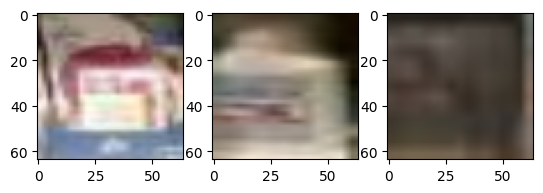

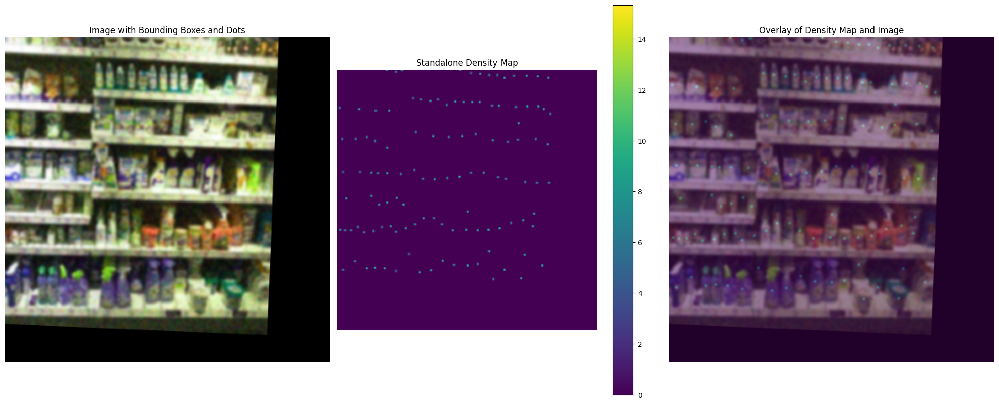

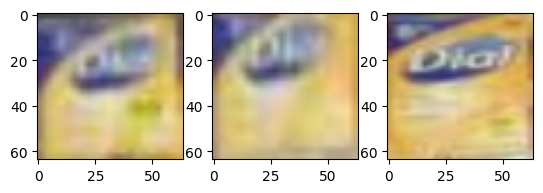

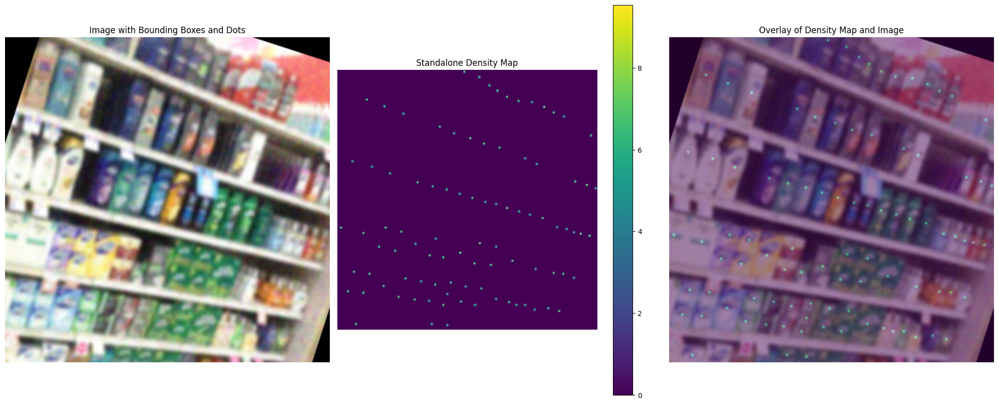

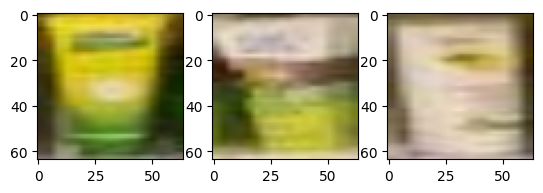

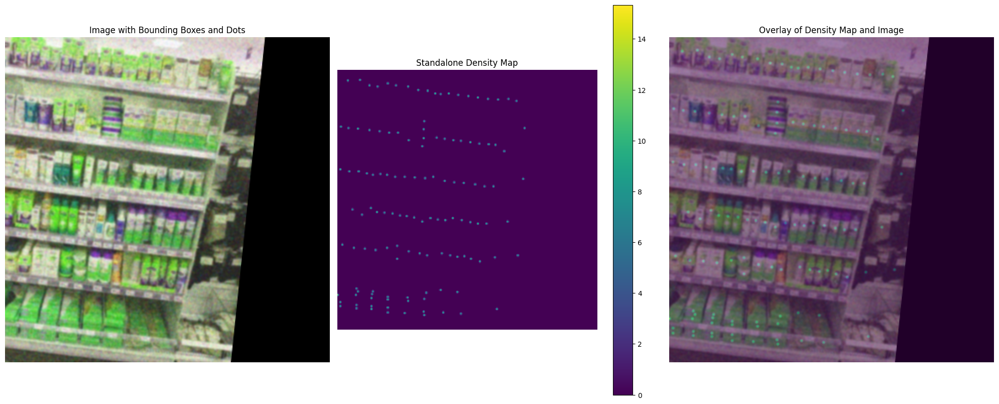

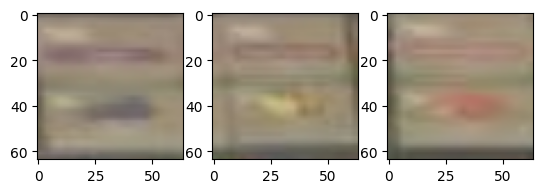

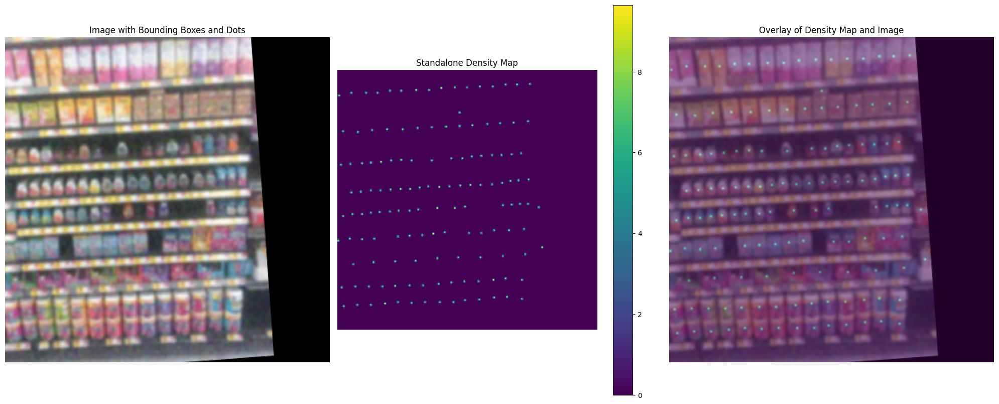

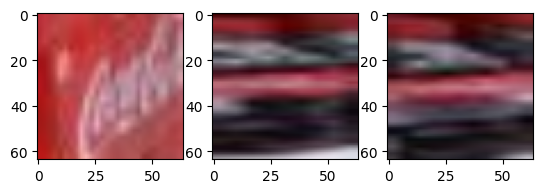

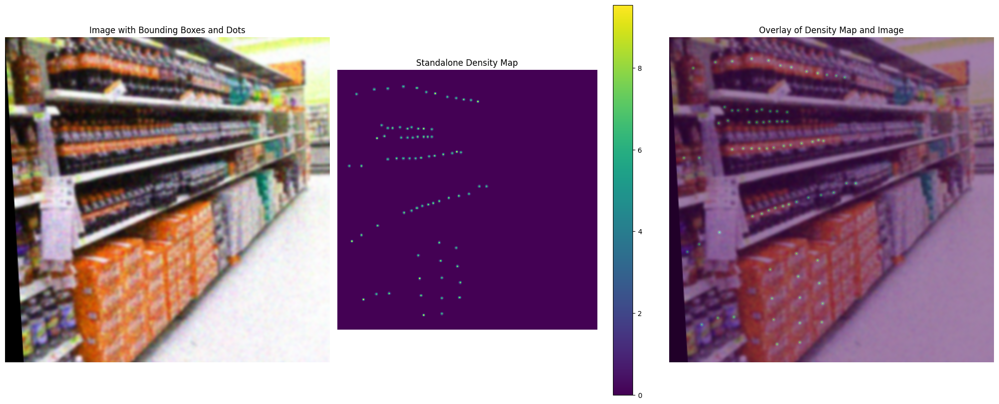

In [ ]:
for idx, a in enumerate(train_dataset):
  if idx > 4: break
  show([a['boxes'][i] for i in range(len(a['boxes']))])
  draw(image=a['image'], line_boxes=a['pos'].tolist(), density_map=a['density_gt'])

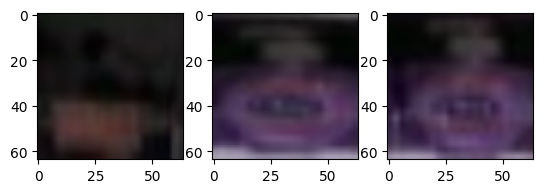

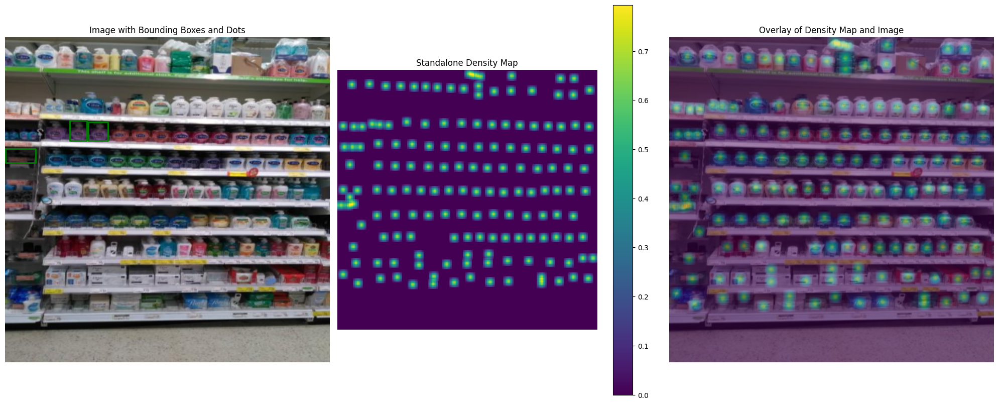

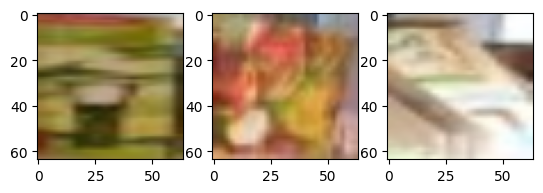

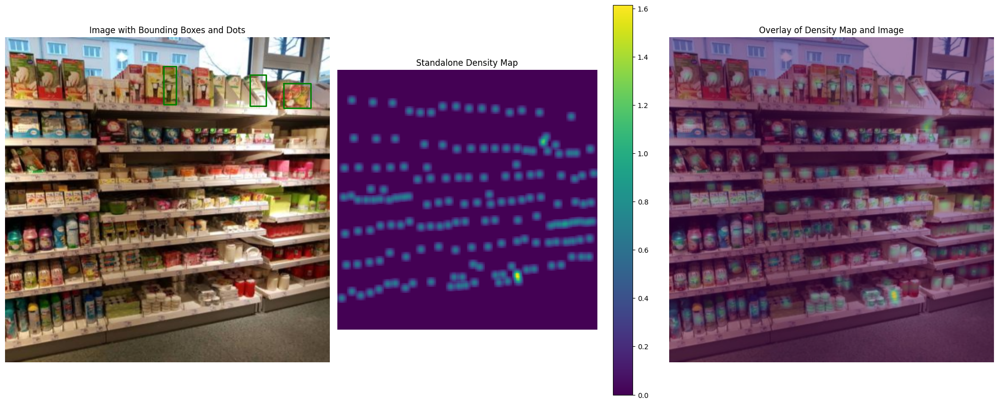

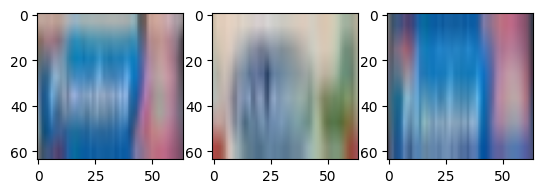

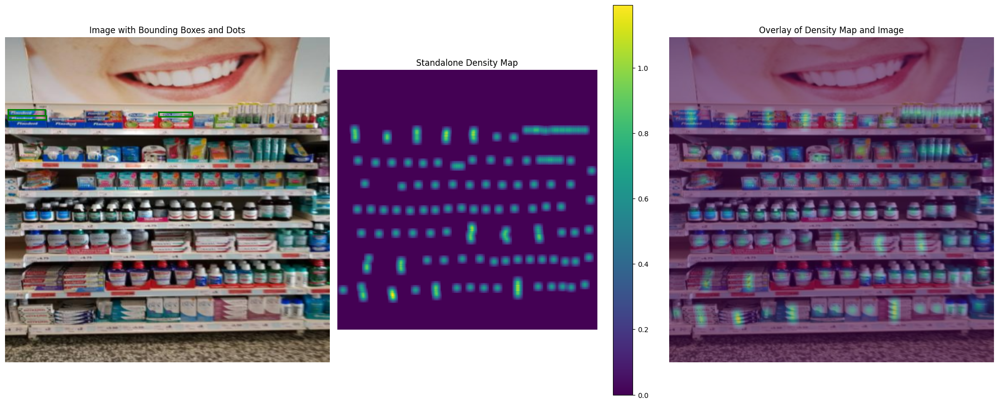

In [ ]:
for idx, a in enumerate(val_dataset):
  if idx > 2: break
  show([a['boxes'][i] for i in range(len(a['boxes']))])
  draw(image=a['image'], line_boxes=a['pos'].tolist(), density_map=a['density_gt'])

## Experiments

In the experiments we will:
- Evaluate the base model CounTR with various size and hyperparameter on new test Dataset
- Apply various finetuning technique

CounTR repo: [CounTR](https://github.com/Verg-Avesta/CounTR/tree/main?tab=readme-ov-file#fine-tuned-weights)

In [ ]:
import gdown

def download_weights(id, target_name):

  weight = f"https://drive.google.com/uc?id={fsc_id}"
  gdown.download(weight, target_name, quiet=False)

Download weight

In [ ]:
fsc_id = "1CzYyiYqLshMdqJ9ZPFJyIzXBa7uFUIYZ"
car_id = "1f0yy4pLAdtR7CL1OzMF123wiHgJ8KpPS"

download_weights(fsc_id, "count_fsc.pth")

# download_weights(car_id, "count_car.pth")

Downloading...
From (original): https://drive.google.com/uc?id=1CzYyiYqLshMdqJ9ZPFJyIzXBa7uFUIYZ
From (redirected): https://drive.google.com/uc?id=1CzYyiYqLshMdqJ9ZPFJyIzXBa7uFUIYZ&confirm=t&uuid=7441d343-935f-43a3-bcc5-668e1a15b370
To: /content/count_fsc.pth
100%|██████████| 1.19G/1.19G [00:21<00:00, 54.8MB/s]


In [ ]:
def load_model_checkpoint(countmodel, checkpoint_path, do_resume=False):
  checkpoint = torch.load(checkpoint_path, map_location='cpu')

  # Handle positional embedding mismatch
  if 'pos_embed' in checkpoint['model'] and checkpoint['model']['pos_embed'].shape != \
    countmodel.model.state_dict()['pos_embed'].shape:
      print(f"Removing key pos_embed from pretrained checkpoint")
      del checkpoint['model']['pos_embed']

  # Load model weights
  countmodel.model.load_state_dict(checkpoint['model'], strict=False)
  print("Resume checkpoint %s" % checkpoint_path)

  # Optionally load optimizer state and scaler for resuming training
  if 'optimizer' in checkpoint and 'epoch' in checkpoint and do_resume:
    optimizer_state = checkpoint['optimizer']
    scaler_state = checkpoint.get('scaler', None)

    # Update the optimizer state in Lightning (manually inject state)
    optimizer = countmodel.configure_optimizers()
    if isinstance(optimizer, dict):
        optimizer = optimizer['optimizer']
    optimizer.load_state_dict(optimizer_state)

    if scaler_state and countmodel.loss_scaler is not None:
        countmodel.loss_scaler.load_state_dict(scaler_state)

    # Update starting epoch for training
    start_epoch = checkpoint['epoch'] + 1
    print("With optim & scheduler!")
    return start_epoch

In [ ]:
from CounTR.util.misc import NativeScalerWithGradNormCount as NativeScaler
import CounTR.models_mae_cross as models_mae_cross
import CounTR.util.misc as misc

class CountingModel(LightningModule):

    def __init__(self,
                 model="mae_vit_base_patch16",
                 pretrained_weight=None,
                 blr=1e-3,
                 lr=None,
                 min_lr=0.0,
                 weight_decay=0.05,
                 norm_pix_loss=False,
                 mask_ratio=0.5,
                 batch_size=26,
                 accum_iter=1,
                do_resume=False,):

        super().__init__()

        self.model = models_mae_cross.__dict__[model](norm_pix_loss=norm_pix_loss)
        self.loss_scaler = NativeScaler()

        # Optimization parameters
        self.blr = blr
        self.lr = lr
        self.min_lr = min_lr
        self.weight_decay = weight_decay
        self.batch_size = batch_size
        self.accum_iter = accum_iter
        self.mask_ratio = mask_ratio

        # Load pretrained weights if provided

        if pretrained_weight:
            load_model_checkpoint(self, pretrained_weight, do_resume=do_resume)

        self.save_hyperparameters()

        self.mae_metric = MeanAbsoluteError()
        self.rmse_metric = MeanSquaredError(squared=False)


    def forward(self, samples, boxes, shot_num):
        samples = samples.to(torch.float32) # astype from float64 to float32 (if needed)
        return self.model(samples, boxes, shot_num)


    def training_step(self, batch, batch_idx):
        samples, boxes, gt_density, m_flag = batch['image'], batch['boxes'], batch['density_gt'], batch['m_flag']
        device = next(self.parameters()).device

        # If there is at least one image in the batch using Type 2 Mosaic, 0-shot is banned.
        flag = sum(m_flag)
        shot_num = random.randint(1, 3) if flag > 0 else random.randint(0, 3)

        # Forward pass
        output = self(samples, boxes, shot_num)

        # Create mask
        mask = np.random.binomial(n=1, p=0.8, size=(384, 384))
        masks = torch.tensor(mask).to(device).expand_as(output)

        # Compute loss and metrics
        loss, mae, rmse, _ = self.compute_loss_and_metrics(output, gt_density, masks)

        # Log metrics
        self.log_dict({"train/Loss": loss, "train/MAE": mae, "train/RMSE": rmse}, prog_bar=True, sync_dist=True)

        # Only log the media in lát batch
        train_dataloader = self.trainer.train_dataloader  # Access the first validation dataloader
        total_batches = len(train_dataloader)
        if batch_idx == total_batches - 1:
        # if batch_idx == len(self.trainer.datamodule.train_dataloader()) - 1:
            # Log images for the last batch
            self.log_image_wandb(output, batch, mode="train")
        # self.log_image_wandb(output, batch, mode="train")

        return loss



    def validation_step(self, batch, batch_idx):
        samples, boxes, gt_density, _ = batch['image'], batch['boxes'], batch['density_gt'], batch['m_flag']
        device = next(self.parameters()).device

        # Forward pass
        shot_num = random.randint(0, 3)
        output = self(samples, boxes, shot_num)

        # Create mask
        mask = np.ones((384, 384))  # No masking during validation

        masks = torch.tensor(mask).to(device).expand_as(output)

        # Compute metrics
        _, mae, rmse, nae = self.compute_loss_and_metrics(output, gt_density, masks)

        # Log metrics
        self.log_dict({"val/MAE": mae, "val/RMSE": rmse, "val/NAE": nae}, prog_bar=True, sync_dist=True)

        # log wandb image
        # Only log the media in last batch
        val_dataloader = self.trainer.val_dataloaders  # Access the first validation dataloader
        total_batches = len(val_dataloader)
        if batch_idx == total_batches - 1:
        # if batch_idx == len(self.trainer.datamodule.val_dataloaders()) - 1:
            # Log images for the last batch
            self.log_image_wandb(output, batch, mode="val")
        # self.log_image_wandb(output, batch, mode="val")


    def test_step(self, batch, batch_idx):
        samples, boxes, gt_density, _ = batch['image'], batch['boxes'], batch['density_gt'], batch['m_flag']
        device = next(self.parameters()).device

        # Forward pass
        shot_num = boxes.shape[1] # the num shot
        output = self(samples, boxes, shot_num)

        # Create mask
        mask = np.ones((384, 384))  # No masking during validation
        masks = torch.tensor(mask).to(device).expand_as(output)

        # Compute metrics
        _, mae, rmse, nae = self.compute_loss_and_metrics(output, gt_density, masks)

        # Log metrics
        self.log_dict({"test/MAE": mae, "test/RMSE": rmse, "test/NAE": nae}, prog_bar=True, sync_dist=True)
        self.log("shot_num", shot_num, prog_bar=True, sync_dist=True)

        # Log image to wandb (if logger is wandb)
        self.log_image_wandb(output, batch, mode="test")


    def compute_loss_and_metrics(self, output, gt_density, masks):
        """Compute loss, MAE, RMSE, and NAE."""
        # Compute loss
        loss = ((output - gt_density) ** 2 * masks / (384 * 384)).sum() / output.shape[0]

        # Metrics: MAE, RMSE, NAE
        pred_cnt = output.view(output.size(0), -1).sum(1) / 60
        gt_cnt = gt_density.view(gt_density.size(0), -1).sum(1) / 60
        mae = self.mae_metric(pred_cnt, gt_cnt)
        rmse = self.rmse_metric(pred_cnt, gt_cnt)
        cnt_err = torch.abs(pred_cnt - gt_cnt)
        nae = (cnt_err / (gt_cnt + 1e-6)).mean()  # Avoid division by zero

        return loss, mae, rmse, nae

    def log_image_wandb(self, output, batch, mode="train"):
        """
        Log visualizations for both training and validation phases.

        Args:
            output: The model's predicted output (for the current batch).
            batch: batch samples
            mode: The mode - "train" or "val" or "test".
        """
        samples, boxes, gt_density, pos, im_names, cnt_gt = batch['image'], batch['boxes'], batch['density_gt'], batch['pos'], batch['image_name'], batch['count']
        if not hasattr(self.logger, "experiment") or not isinstance(self.logger.experiment, wandb.wandb_sdk.wandb_run.Run):
          return

        # Lists to collect visualizations for WandB
        wandb_densities = []
        wandb_bboxes = []
        black = torch.zeros([384, 384], device=output.device)  # Black canvas for overlays

        # Iterate through each sample in the batch
        for i in range(output.shape[0]):
            # Log density maps (ground truth and predicted)
            w_d_map = torch.stack([output[i], black, black])
            gt_map = torch.stack([gt_density[i], black, black])
            box_map = misc.get_box_map(samples[i], pos[i], output.device)
            w_gt_density = samples[i] / 2 + gt_map + box_map
            w_d_map_overlay = samples[i] / 2 + w_d_map
            w_densities = torch.cat([w_gt_density, w_d_map, w_d_map_overlay], dim=2)
            w_densities = torch.clamp(w_densities, 0, 1)  # Ensure values are between 0 and 1

            # Prepare the WandB image and add it to the list
            wandb_densities.append(wandb.Image(torchvision.transforms.ToPILImage()(w_densities),
                                               caption=f"[E#{self.current_epoch}] {im_names[i]} cnt: {cnt_gt[i]} (dens_gt: {torch.sum(gt_density[i] / 60).item():.3f}, pred: {torch.sum(output[i] / 60).item():.3f})"))

            # Log bounding boxes
            w_boxes = torch.cat([boxes[i][x, :, :, :] for x in range(boxes[i].shape[0])], 2)
            wandb_bboxes.append(wandb.Image(torchvision.transforms.ToPILImage()(w_boxes),
                                            caption=f"[E#{self.current_epoch}] {im_names[i]}"))

        # Log the visualizations to WandB (whether train or val phase)
        if mode == "train":
            wandb.log({"train_densities": wandb_densities, "train_bboxes": wandb_bboxes})
        elif mode == "val":
            wandb.log({"val_densities": wandb_densities, "val_bboxes": wandb_bboxes})
        else:
            wandb.log({"test_densities": wandb_densities, "test_bboxes": wandb_bboxes})


    def configure_optimizers(self):

        # Effective batch size
        eff_batch_size = self.batch_size * self.accum_iter
        lr = self.blr * eff_batch_size / 256 if self.lr is None else self.lr

        # Optimizer
        param_groups = optim_factory.add_weight_decay(self.model, self.weight_decay)
        optimizer = torch.optim.AdamW(param_groups, lr=lr, betas=(0.9, 0.95))
        return optimizer

### Evaluate the Pretrained CounTR model

In this section, we will try various CounTR pretrained model on our test dataset:
- mae_vit_base_patch16: mae_vit_base_patch16_dec512d8b
- mae_vit_base4_patch16: mae_vit_base_patch16_fim4 (decoder: 4 blocks)
- mae_vit_base6_patch16: mae_vit_base_patch16_fim6 ( decoder: 6 blocks)
- mae_vit_large_patch16: mae_vit_large_patch16_dec512d8b
- mae_vit_huge_patch14: mae_vit_huge_patch14_dec512d8b

Lets see the model architecture of `mae_vit_base_patch14`

In [ ]:
batch_size = 26
model = CountingModel(
                 model="mae_vit_base_patch16",
                 pretrained_weight="count_fsc.pth",
                 batch_size=batch_size
)
model.model

/kaggle/working/CounTR/util/misc.py:264: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self._scaler = torch.cuda.amp.GradScaler()
/tmp/ipykernel_23/159117833.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have

Resume checkpoint count_fsc.pth


SupervisedMAE(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (blocks): ModuleList(
    (0-11): 12 x Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
    )
  )
  (norm): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
  (decoder_embed): Linear(in_features=768, out_fea

Test the pretrain model on dataset `mae_vit_base_patch16`

In [ ]:
base_models = [
    "mae_vit_base_patch16",
    "mae_vit_base4_patch16",
    "mae_vit_base6_patch16",
    "mae_vit_large_patch16",
    "mae_vit_huge_patch14"]

project = "Object Counting Experiments"
group = "Evaluate base"

In [ ]:
name = base_models[0]

# wandb_logger.experiment.config["batch_size"] = batch_size
wandb_logger = WandbLogger(
    project=project,
    group=group,
    name=name,
    log_model=False
)

eval_model = CountingModel(
         model=name,
         pretrained_weight="count_fsc.pth",
         batch_size=26
)

test_trainer = Trainer(
    max_epochs=1,
    logger=wandb_logger,
    accelerator="auto",
    devices=-1,
    precision="16-mixed", # using 16-bit floating point (16FP) mix with 32FP (AMP)
    # strategy="ddp_notebook",
    accumulate_grad_batches=1, # accum_iter = 1
)

/tmp/ipykernel_23/159117833.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cpu')


Resume checkpoint count_fsc.pth


In [ ]:
# mae_vit_base_patch16
test_trainer.test(eval_model, test_dataloader_shot3)
wandb_logger.experiment.finish()

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         shot_num          │            3.0            │
│         test/MAE          │    49.775638580322266     │
│         test/NAE          │    0.3256851136684418     │
│         test/RMSE         │     61.88346481323242     │
└───────────────────────────┴───────────────────────────┘

epoch,▁
shot_num,▁
test/MAE,▁
test/NAE,▁
test/RMSE,▁
trainer/global_step,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,0
shot_num,3
test/MAE,49.77564
test/NAE,0.32569
test/RMSE,61.88346


In [ ]:
# mae_vit_base_patch16
test_trainer.test(eval_model, test_dataloader_shot3)
wandb_logger.experiment.finish()

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    49.354854583740234     │
│         test/NAE          │    0.32304540276527405    │
│         test/RMSE         │     61.38650894165039     │
└───────────────────────────┴───────────────────────────┘

epoch,▁
test/MAE,▁
test/NAE,▁
test/RMSE,▁
trainer/global_step,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,0
test/MAE,49.35485
test/NAE,0.32305
test/RMSE,61.38651
trainer/global_step,0


In [ ]:
name = base_models[1]

# wandb_logger.experiment.config["batch_size"] = batch_size
wandb_logger = WandbLogger(
    project=project,
    group=group,
    name=name,
    log_model=False
)

eval_model = CountingModel(
         model=name,
         pretrained_weight="count_fsc.pth",
         batch_size=batch_size
)

test_trainer = Trainer(
    max_epochs=1,
    logger=wandb_logger,
    accelerator="auto",
    devices=-1,
    precision="16-mixed", # using 16-bit floating point (16FP) mix with 32FP (AMP)
    # strategy="ddp_notebook",
    accumulate_grad_batches=1, # accum_iter = 1
)
# mae_vit_base_patch16
test_trainer.test(eval_model, test_dataloader_shot3)
wandb_logger.experiment.finish()

/tmp/ipykernel_23/159117833.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cpu')


Resume checkpoint count_fsc.pth


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │     69.86640167236328     │
│         test/NAE          │    0.45489823818206787    │
│         test/RMSE         │     79.94216918945312     │
└───────────────────────────┴───────────────────────────┘

epoch,▁
test/MAE,▁
test/NAE,▁
test/RMSE,▁
trainer/global_step,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,0
test/MAE,69.8664
test/NAE,0.4549
test/RMSE,79.94217
trainer/global_step,0


In [ ]:
name = base_models[2]

# wandb_logger.experiment.config["batch_size"] = batch_size
wandb_logger = WandbLogger(
    project=project,
    group=group,
    name=name,
    log_model=False
)

eval_model = CountingModel(
         model=name,
         pretrained_weight="count_fsc.pth",
         batch_size=batch_size
)

test_trainer = Trainer(
    max_epochs=1,
    logger=wandb_logger,
    accelerator="auto",
    devices=-1,
    precision="16-mixed", # using 16-bit floating point (16FP) mix with 32FP (AMP)
    # strategy="ddp_notebook",
    accumulate_grad_batches=1, # accum_iter = 1
)
# mae_vit_base_patch16
test_trainer.test(eval_model, test_dataloader_shot3)
wandb_logger.experiment.finish()

/tmp/ipykernel_23/159117833.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cpu')


Resume checkpoint count_fsc.pth


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test/MAE          │    104.00050354003906     │
│         test/NAE          │     0.697076141834259     │
│         test/RMSE         │     112.0174331665039     │
└───────────────────────────┴───────────────────────────┘

epoch,▁
test/MAE,▁
test/NAE,▁
test/RMSE,▁
trainer/global_step,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,0
test/MAE,104.0005
test/NAE,0.69708
test/RMSE,112.01743
trainer/global_step,0


### Fine tuning method

For the best base model, we will use the `mae_vit_base_patch16` for fine tunning

We will freezing some layer and finetune with 10 epochs. We will try:
- Freeze All except: `decoder_head*` layer
- Freeze All except: `CrossAttention` block of decoder block (FIM module)
- Freeze All except: `decoder_head*` and `CrossAttention` block of decoder block (FIM moudle)

Apply other finetune techniques:
- Appy Lora on `CrossAttention` block of decoder block(FIM module) and `self-attention` in ViT base

In [ ]:
def freeze_layers(model, except_layer = []):
    """
    Freeze parameters of the model except for the layers in except_layer.

    Args:
        model (torch.nn.Module): The model to modify.
        except_layer (list): List of strings with layer names to exclude from freezing.
    """
    for name, param in model.named_parameters():
        if not any(layer in name for layer in except_layer):
            # print(f"Froze layer {name}")
            param.requires_grad = False # Freeze
        else:
            print(f"UnFreeze layer {name}")
            param.requires_grad = True # UnFreeze

#### Finetune only Decode_head* layers

In [ ]:
except_layer = [f"decode_head{i}" for i in range(4)]

train_model1 = CountingModel(
         model='mae_vit_base_patch16',
         pretrained_weight="count_fsc.pth",
         batch_size=26
)
freeze_layers(train_model1.model, except_layer)

/tmp/ipykernel_23/159117833.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cpu')


Resume checkpoint count_fsc.pth
UnFreeze layer decode_head0.0.weight
UnFreeze layer decode_head0.0.bias
UnFreeze layer decode_head0.1.weight
UnFreeze layer decode_head0.1.bias
UnFreeze layer decode_head1.0.weight
UnFreeze layer decode_head1.0.bias
UnFreeze layer decode_head1.1.weight
UnFreeze layer decode_head1.1.bias
UnFreeze layer decode_head2.0.weight
UnFreeze layer decode_head2.0.bias
UnFreeze layer decode_head2.1.weight
UnFreeze layer decode_head2.1.bias
UnFreeze layer decode_head3.0.weight
UnFreeze layer decode_head3.0.bias
UnFreeze layer decode_head3.1.weight
UnFreeze layer decode_head3.1.bias
UnFreeze layer decode_head3.3.weight
UnFreeze layer decode_head3.3.bias


In [ ]:
def load_model_checkpoint_resume(countmodel, checkpoint_path, do_resume=False):
    checkpoint = torch.load(checkpoint_path, map_location='cpu')


    # In your checkpoint, the model weights are under 'state_dict'
    if 'state_dict' in checkpoint:
        state_dict = checkpoint['state_dict']
        countmodel.model.load_state_dict(state_dict, strict=False)
    else:
        raise KeyError("Checkpoint does not contain 'state_dict' key")

    print("Resume checkpoint %s" % checkpoint_path)

    # Optionally load optimizer state and scaler for resuming training
    if 'optimizer_states' in checkpoint and 'epoch' in checkpoint and do_resume:
        optimizer_state = checkpoint['optimizer_states'][0]  # Assuming optimizer states are in a list
        scaler_state = checkpoint.get('MixedPrecision', None)

        # Update the optimizer state in Lightning (manually inject state)
        optimizer = countmodel.configure_optimizers()
        if isinstance(optimizer, dict):
            optimizer = optimizer['optimizer']
        optimizer.load_state_dict(optimizer_state)

        if scaler_state and countmodel.loss_scaler is not None:
            countmodel.loss_scaler.load_state_dict(scaler_state)

        # Update starting epoch for training
        start_epoch = checkpoint['epoch'] + 1
        print("With optim & scheduler!")
        return start_epoch


In [ ]:
# Resume training
checkpoint_unfreeze_decode_head = "/kaggle/working/Unfreeze-decoder_head*-best.ckpt"
except_layer = [f"decode_head{i}" for i in range(4)]

train_model1_resume = CountingModel(
         model='mae_vit_base_patch16',
         batch_size=26
)
load_model_checkpoint_resume(train_model1_resume, checkpoint_unfreeze_decode_head)
freeze_layers(train_model1_resume, except_layer)

/tmp/ipykernel_23/1103777336.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cpu')


Resume checkpoint /kaggle/working/Unfreeze-decoder_head*-best.ckpt
UnFreeze layer model.decode_head0.0.weight
UnFreeze layer model.decode_head0.0.bias
UnFreeze layer model.decode_head0.1.weight
UnFreeze layer model.decode_head0.1.bias
UnFreeze layer model.decode_head1.0.weight
UnFreeze layer model.decode_head1.0.bias
UnFreeze layer model.decode_head1.1.weight
UnFreeze layer model.decode_head1.1.bias
UnFreeze layer model.decode_head2.0.weight
UnFreeze layer model.decode_head2.0.bias
UnFreeze layer model.decode_head2.1.weight
UnFreeze layer model.decode_head2.1.bias
UnFreeze layer model.decode_head3.0.weight
UnFreeze layer model.decode_head3.0.bias
UnFreeze layer model.decode_head3.1.weight
UnFreeze layer model.decode_head3.1.bias
UnFreeze layer model.decode_head3.3.weight
UnFreeze layer model.decode_head3.3.bias


In [ ]:
project = "Object Counting Experiments"
group = "Fine-tunning"
name = "Unfreeze-decoder_head*"
epochs = 20

wandb_logger = WandbLogger(
    project=project,
    group=group,
    name=name,
    log_model=True
)

checkpoint_callback = ModelCheckpoint(
    monitor='val/RMSE',
    dirpath='checkpoints/',
    filename=f'{name}-best',
    save_top_k=1,
    mode='min',  # min RMSE is best
    verbose=True
)

early_stop_callback = EarlyStopping(
    monitor='val/MAE',
    patience=5,
    mode='min',
    verbose=True
)

trainer = Trainer(
    max_epochs=epochs,
    logger=wandb_logger,
    accelerator="auto",
    devices=-1,
    precision="16-mixed", # using 16-bit floating point (16FP) mix with 32FP (AMP)
    # strategy="ddp_notebook",
    accumulate_grad_batches=1, # accum_iter = 1
    callbacks=[checkpoint_callback, early_stop_callback],
)

In [ ]:
# resume Run over 10 epochs
trainer.fit(model=train_model1_resume,
            train_dataloaders=train_dataloader,
            val_dataloaders=val_dataloader,
            ckpt_path="Unfreeze-decoder_head*-best.ckpt")

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [ ]:
# log best model
trainer.test(train_model1, test_dataloader_shot3)
wandb_logger.experiment.finish()

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         shot_num          │            3.0            │
│         test/MAE          │     26.94267463684082     │
│         test/NAE          │    0.2098376601934433     │
│         test/RMSE         │    34.969818115234375     │
└───────────────────────────┴───────────────────────────┘

epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇█
shot_num,▁
test/MAE,▁
test/NAE,▁
test/RMSE,▁
train/Loss,▅▃▅▅▆▃▅▆▄▅▇▂▂▄▃▁▃▂█▄▃▇▅
train/MAE,▆▃▆▃▄▃▂▃▆▃▅▄▂▂▅▂▃▁█▃▄▅▃
train/RMSE,▆▄▅▄▅▃▂▄▅▃▅▃▄▃▄▂▂▁█▃▄▄▃
trainer/global_step,▁▁▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇████████
val/MAE,█▁▂▁▂▁▂▅▂▁
val/NAE,█▁▂▁▂▁▂▅▂▁


In [ ]:
# After resume over 10 epochs
trainer.test(train_model1_resume, test_dataloader_shot3)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         shot_num          │            3.0            │
│         test/MAE          │     34.19870376586914     │
│         test/NAE          │    0.2662588953971863     │
│         test/RMSE         │     42.62924575805664     │
└───────────────────────────┴───────────────────────────┘

[{'test/MAE': 34.19870376586914,
  'test/RMSE': 42.62924575805664,
  'test/NAE': 0.2662588953971863,
  'shot_num': 3.0}]

#### Unfreeze only CrossAttention block

In [ ]:
except_layer = ["decoder_blocks.0", "decoder_blocks.1"]

model_test_cross = CountingModel(
         model='mae_vit_base_patch16',
         pretrained_weight="count_fsc.pth",
         batch_size=26
)

freeze_layers(model_test_cross, except_layer)

<ipython-input-18-c6971e23e873>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cpu')


Resume checkpoint count_fsc.pth
UnFreeze layer model.decoder_blocks.0.norm0.weight
UnFreeze layer model.decoder_blocks.0.norm0.bias
UnFreeze layer model.decoder_blocks.0.selfattn.qkv.weight
UnFreeze layer model.decoder_blocks.0.selfattn.qkv.bias
UnFreeze layer model.decoder_blocks.0.selfattn.proj.weight
UnFreeze layer model.decoder_blocks.0.selfattn.proj.bias
UnFreeze layer model.decoder_blocks.0.norm1.weight
UnFreeze layer model.decoder_blocks.0.norm1.bias
UnFreeze layer model.decoder_blocks.0.attn.wq.weight
UnFreeze layer model.decoder_blocks.0.attn.wq.bias
UnFreeze layer model.decoder_blocks.0.attn.wk.weight
UnFreeze layer model.decoder_blocks.0.attn.wk.bias
UnFreeze layer model.decoder_blocks.0.attn.wv.weight
UnFreeze layer model.decoder_blocks.0.attn.wv.bias
UnFreeze layer model.decoder_blocks.0.attn.proj.weight
UnFreeze layer model.decoder_blocks.0.attn.proj.bias
UnFreeze layer model.decoder_blocks.0.norm2.weight
UnFreeze layer model.decoder_blocks.0.norm2.bias
UnFreeze layer mod

In [ ]:
project = "Object Counting Experiments"
group = "Fine-tunning"
name = "Unfreeze-CrossAttention"

wandb_logger = WandbLogger(
    project=project,
    group=group,
    name=name,
    log_model=True
)

checkpoint_callback = ModelCheckpoint(
    monitor='val/MAE',
    dirpath='checkpoints/',
    filename='CrossAtt-{epoch:02d}-{val_MAE:.3f}-{val_RMSE:.2f}-{val_NAE:.2f}',
    save_top_k=1,
    mode='min',  # min MAE is best
    verbose=True
)

early_stop_callback = EarlyStopping(
    monitor='val/MAE',
    patience=10,
    mode='min',
    verbose=True
)

trainer = Trainer(
    max_epochs=epochs,
    logger=wandb_logger,
    accelerator="auto",
    devices=-1,
    precision="16-mixed", # using 16-bit floating point (16FP) mix with 32FP (AMP)
    # strategy="ddp_notebook",
    accumulate_grad_batches=1, # accum_iter = 1
    callbacks=[checkpoint_callback, early_stop_callback],
)

INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
<ipython-input-18-c6971e23e873>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.s

Resume checkpoint count_fsc.pth


In [ ]:
trainer.fit(model_test_cross, train_dataloader, val_dataloader)

In [ ]:
trainer.test(model_test_cross, test_dataloader_shot3, ckpt_path=checkpoint_callback.best_model_path)

wandb: Currently logged in as: meooggi133 (meooggi133-tr-ng-i-h-c-khoa-h-c-t-nhi-n-hqg-hcm). Use `wandb login --relogin` to force relogin


INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/artifacts/model-ax4koi3s:v1/model.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/artifacts/model-ax4koi3s:v1/model.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         shot_num          │            3.0            │
│         test/MAE          │    21.272764205932617     │
│         test/NAE          │    0.16120381653308868    │
│         test/RMSE         │     31.43937873840332     │
└───────────────────────────┴───────────────────────────┘

[{'test/MAE': 21.272764205932617,
  'test/RMSE': 31.43937873840332,
  'test/NAE': 0.16120381653308868,
  'shot_num': 3.0}]

#### Finetune Decode_head* and CrossAttention blocks

In [ ]:
except_layer = [f"decode_head{i}" for i in range(4)] + ["decoder_blocks.0", "decoder_blocks.1"]

train_model2 = CountingModel(
         model='mae_vit_base_patch16',
         pretrained_weight="count_fsc.pth",
         batch_size=26
)

freeze_layers(train_model2.model, except_layer)

<ipython-input-22-c6971e23e873>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cpu')


Resume checkpoint count_fsc.pth
UnFreeze layer decoder_blocks.0.norm0.weight
UnFreeze layer decoder_blocks.0.norm0.bias
UnFreeze layer decoder_blocks.0.selfattn.qkv.weight
UnFreeze layer decoder_blocks.0.selfattn.qkv.bias
UnFreeze layer decoder_blocks.0.selfattn.proj.weight
UnFreeze layer decoder_blocks.0.selfattn.proj.bias
UnFreeze layer decoder_blocks.0.norm1.weight
UnFreeze layer decoder_blocks.0.norm1.bias
UnFreeze layer decoder_blocks.0.attn.wq.weight
UnFreeze layer decoder_blocks.0.attn.wq.bias
UnFreeze layer decoder_blocks.0.attn.wk.weight
UnFreeze layer decoder_blocks.0.attn.wk.bias
UnFreeze layer decoder_blocks.0.attn.wv.weight
UnFreeze layer decoder_blocks.0.attn.wv.bias
UnFreeze layer decoder_blocks.0.attn.proj.weight
UnFreeze layer decoder_blocks.0.attn.proj.bias
UnFreeze layer decoder_blocks.0.norm2.weight
UnFreeze layer decoder_blocks.0.norm2.bias
UnFreeze layer decoder_blocks.0.mlp.fc1.weight
UnFreeze layer decoder_blocks.0.mlp.fc1.bias
UnFreeze layer decoder_blocks.0.ml

In [ ]:
project = "Object Counting Experiments"
group = "Fine-tunning"
name = "Unfreeze_CrossAttention_decode_head*"
epochs = 20

wandb_logger = WandbLogger(
    project=project,
    group=group,
    name=name,
    log_model=True
)

checkpoint_callback = ModelCheckpoint(
    monitor='val/MAE',
    dirpath='checkpoints/',
    filename='CrossAtt-{epoch:02d}-{val_MAE:.3f}-{val_RMSE:.2f}-{val_NAE:.2f}',
    save_top_k=1,
    mode='min',  # min MAE is best
    verbose=True
)

early_stop_callback = EarlyStopping(
    monitor='val/MAE',
    patience=10,
    mode='min',
    verbose=True
)

trainer = Trainer(
    max_epochs=epochs,
    logger=wandb_logger,
    accelerator="auto",
    devices=-1,
    precision="16-mixed", # using 16-bit floating point (16FP) mix with 32FP (AMP)
    # strategy="ddp_notebook",
    accumulate_grad_batches=1, # accum_iter = 1
    callbacks=[checkpoint_callback, early_stop_callback],
)

In [ ]:
trainer.fit(train_model2, train_dataloader, val_dataloader)

In [ ]:
trainer.test(train_model2, test_dataloader_shot3)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         shot_num          │            3.0            │
│         test/MAE          │    47.365848541259766     │
│         test/NAE          │    0.3603126108646393     │
│         test/RMSE         │     54.23090362548828     │
└───────────────────────────┴───────────────────────────┘

[{'test/MAE': 47.365848541259766,
  'test/RMSE': 54.23090362548828,
  'test/NAE': 0.3603126108646393,
  'shot_num': 3.0}]

In [ ]:
# save the model
artifact = wandb.Artifact(
    name="CrossAtt_epoch_09_val_MAE_26.80_val_RMSE_40.77_val_NAE_0.16.ckpt",  # Name for the artifact
    type="model",  # Artifact typept
    description="Best model checkpoint",
)
artifact.add_file(checkpoint_callback.best_model_path)

ArtifactManifestEntry(path='CrossAtt-epoch=09-val_MAE=0.000-val_RMSE=0.00-val_NAE=0.00.ckpt', digest='OHPLaJlVNJoED08RuBGsXQ==', size=489787064, local_path='/root/.local/share/wandb/artifacts/staging/tmp0iztmvd1', skip_cache=False)

In [ ]:
wandb.log_artifact(artifact)

<Artifact CrossAtt_epoch_09_val_MAE_26.80_val_RMSE_40.77_val_NAE_0.16.ckpt>

In [ ]:
wandb_logger.experiment.finish()

epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇██
shot_num,▁
test/MAE,▁
test/NAE,▁
test/RMSE,▁
train/Loss,▆▄▃▅▄▅▂▆▃▄▃▇▄▃█▆▂▃▁▄▇▁▃▃▃▂█▃▃▃▄▁▆▂▄▅▅▄▃▃
train/MAE,▃▂▃▆█▂▃▆▃▆▅▄▄▆▂▄▃▂▂▂▂▆▅▆▂▆▃▅▂▂▃▂▄▂▅▃▁▂▂▂
train/RMSE,▃▃▃▇█▂▃▇▃▆▅▄▄▅▃▇▃▁▃▂▂▅▅▅▂▆▅▅▂▂▄▂▅▂▅▄▁▂▂▃
trainer/global_step,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██████████████████████
val/MAE,▇▂▄▆▃▄▁▅▆▁▃▃▅█▆▁▆▂▅▄
val/NAE,▇▂▄▆▃▄▁▅▆▁▄▄▅█▆▁▆▂▅▄


### Apply Lora

In [ ]:
from peft import get_peft_model, LoraConfig, TaskType

model_train_lora = CountingModel(
         model='mae_vit_base_patch16',
         pretrained_weight="count_fsc.pth",
         batch_size=26
)

# Tạo LoRA config
lora_config = LoraConfig(
    # task_type=TaskType.FEATURE_EXTRACTION,
    inference_mode=False,
    r=4,
    lora_alpha=32,
    lora_dropout=0.1,
    target_modules=[
        "qkv", "proj",  # Attention in blocks (ViT backbone) and CrossAttention (decoder_blocks)
        "fc1", "fc2" # MLP in blocks Attention (ViT backbone)
        "wq", "wk", "wv",  # Cross-Attention in decoder_blocks
    ]
)
# Convert LoRA config to a dictionary for logging
lora_config_dict = {
    "r": lora_config.r,
    "lora_alpha": lora_config.lora_alpha,
    "target_modules": lora_config.target_modules,
    "task_type": lora_config.task_type,
    "target_modules": lora_config.target_modules
}

# Áp dụng LoRA lên các lớp bên trong CountingModel.model
model_train_lora.model = get_peft_model(model_train_lora.model, lora_config)
model_train_lora.model.print_trainable_parameters()
model_train_lora.model

<ipython-input-18-c6971e23e873>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cpu')


Resume checkpoint count_fsc.pth
trainable params: 481,280 || all params: 100,171,905 || trainable%: 0.4805


PeftModel(
  (base_model): LoraModel(
    (model): SupervisedMAE(
      (patch_embed): PatchEmbed(
        (proj): lora.Conv2d(
          (base_layer): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
          (lora_dropout): ModuleDict(
            (default): Dropout(p=0.1, inplace=False)
          )
          (lora_A): ModuleDict(
            (default): Conv2d(3, 4, kernel_size=(16, 16), stride=(16, 16), bias=False)
          )
          (lora_B): ModuleDict(
            (default): Conv2d(4, 768, kernel_size=(1, 1), stride=(1, 1), bias=False)
          )
          (lora_embedding_A): ParameterDict()
          (lora_embedding_B): ParameterDict()
        )
        (norm): Identity()
      )
      (blocks): ModuleList(
        (0-11): 12 x Block(
          (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (attn): Attention(
            (qkv): lora.Linear(
              (base_layer): Linear(in_features=768, out_features=2304, bias=True)
              (lora_dr

In [ ]:
project = "Object Counting Experiments"
group = "Fine-tunning"
name = "LoRa Attention-CrossAttention"
epochs = 20

wandb_logger = WandbLogger(
    project=project,
    group=group,
    name=name,
    log_model=True
)
wandb_logger.log_hyperparams({"lora_config": lora_config_dict})

checkpoint_callback = ModelCheckpoint(
    monitor='val/MAE',
    dirpath='checkpoints/',
    filename='loraAtt-{epoch:02d}-{val_mae:.3f}-{val_rmse:.2f}-{val_nae:.2f}',
    save_top_k=1,
    mode='min',  # min MAE is best
    verbose=True
)

early_stop_callback = EarlyStopping(
    monitor='val/MAE',
    patience=10,
    mode='min',
    verbose=True
)

trainer = Trainer(
    max_epochs=epochs,
    logger=wandb_logger,
    accelerator="auto",
    devices=-1,
    precision="16-mixed", # using 16-bit floating point (16FP) mix with 32FP (AMP)
    # strategy="ddp_notebook",
    accumulate_grad_batches=1, # accum_iter = 1
    callbacks=[checkpoint_callback, early_stop_callback],
)

In [ ]:
trainer.fit(model_train_lora, train_dataloader, val_dataloader)

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /kaggle/working/checkpoints exists and is not empty.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [ ]:
trainer.test(model_train_lora, test_dataloader_shot3, ckpt_path=checkpoint_callback.best_model_path)

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         shot_num          │            3.0            │
│         test/MAE          │    24.916240692138672     │
│         test/NAE          │    0.18671125173568726    │
│         test/RMSE         │     34.99360656738281     │
└───────────────────────────┴───────────────────────────┘

[{'test/MAE': 24.916240692138672,
  'test/RMSE': 34.99360656738281,
  'test/NAE': 0.18671125173568726,
  'shot_num': 3.0}]

In [ ]:
!pip show torch

Name: torch
Version: 2.5.1+cu121
Summary: Tensors and Dynamic neural networks in Python with strong GPU acceleration
Home-page: https://pytorch.org/
Author: PyTorch Team
Author-email: packages@pytorch.org
License: BSD-3-Clause
Location: /usr/local/lib/python3.10/dist-packages
Requires: filelock, fsspec, jinja2, networkx, sympy, typing-extensions
Required-by: accelerate, fastai, lightning, peft, pytorch-lightning, sentence-transformers, timm, torchaudio, torchmetrics, torchvision


## Inference

Tasks:

1. Using gradio or streamlit to test the model